# Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint, uniform

# Import dataset

In [2]:
df=pd.read_csv("Data_Cortex_Nuclear.csv")

In [3]:
print("First 5 rows of the dataset:")
df.head()

First 5 rows of the dataset:


,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [4]:
print("Last 5 rows of the dataset:")
df.tail()

Last 5 rows of the dataset:


,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
1075,J3295_11,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,...,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,Ts65Dn,Saline,S/C,t-SC-s
1076,J3295_12,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,...,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,Ts65Dn,Saline,S/C,t-SC-s
1077,J3295_13,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,...,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,Ts65Dn,Saline,S/C,t-SC-s
1078,J3295_14,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,...,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,Ts65Dn,Saline,S/C,t-SC-s
1079,J3295_15,0.302626,0.461059,0.256564,2.092790,2.594348,0.251001,0.191811,2.361816,0.223632,...,0.187556,0.420347,0.335062,0.252995,0.365278,1.370999,Ts65Dn,Saline,S/C,t-SC-s


# Data Preprocessing

In [5]:
print(f'Dataset have {df.shape[0]} rows and {df.shape[1]} columns')

Dataset have 1080 rows and 82 columns


In [6]:
print("Information about the dataset:")
df.info()

Information about the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MouseID          1080 non-null   object 
 1   DYRK1A_N         1077 non-null   float64
 2   ITSN1_N          1077 non-null   float64
 3   BDNF_N           1077 non-null   float64
 4   NR1_N            1077 non-null   float64
 5   NR2A_N           1077 non-null   float64
 6   pAKT_N           1077 non-null   float64
 7   pBRAF_N          1077 non-null   float64
 8   pCAMKII_N        1077 non-null   float64
 9   pCREB_N          1077 non-null   float64
 10  pELK_N           1077 non-null   float64
 11  pERK_N           1077 non-null   float64
 12  pJNK_N           1077 non-null   float64
 13  PKCA_N           1077 non-null   float64
 14  pMEK_N           1077 non-null   float64
 15  pNR1_N           1077 non-null   float64
 16  pNR2A_N          1077 non-nul

In [7]:
df.columns

Index(['MouseID', 'DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N',
       'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N',
       'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N',
       'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N',
       'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N',
       'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N',
       'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N',
       'pGSK3B_N', 'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N',
       'RRP1_N', 'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N',
       'GluR3_N', 'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N',
       'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N',
       'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N',
       'CaNA_N', 'Genotype', 'Treatment', 'Behavior', 'class'],
      dtype='object')

In [8]:
print("Summary statistics for numeric columns")
df.describe().T

Summary statistics for numeric columns


,count,mean,std,min,25%,50%,75%,max
DYRK1A_N,1077.0,0.425810,0.249362,0.145327,0.288121,0.366378,0.487711,2.516367
ITSN1_N,1077.0,0.617102,0.251640,0.245359,0.473361,0.565782,0.698032,2.602662
BDNF_N,1077.0,0.319088,0.049383,0.115181,0.287444,0.316564,0.348197,0.497160
NR1_N,1077.0,2.297269,0.347293,1.330831,2.057411,2.296546,2.528481,3.757641
NR2A_N,1077.0,3.843934,0.933100,1.737540,3.155678,3.760855,4.440011,8.482553
...,...,...,...,...,...,...,...,...
SYP_N,1080.0,0.446073,0.066432,0.258626,0.398082,0.448459,0.490773,0.759588
H3AcK18_N,900.0,0.169609,0.059402,0.079691,0.125848,0.158240,0.197876,0.479763
EGR1_N,870.0,0.183135,0.040406,0.105537,0.155121,0.174935,0.204542,0.360692
H3MeK4_N,810.0,0.205440,0.055514,0.101787,0.165143,0.193994,0.235215,0.413903


In [9]:
print("Summary statistics for categorical columns")
df[['MouseID','Genotype', 'Treatment', 'Behavior']].describe()

Summary statistics for categorical columns


,MouseID,Genotype,Treatment,Behavior
count,1080,1080,1080,1080
unique,1080,2,2,2
top,309_1,Control,Memantine,S/C
freq,1,570,570,555


# checking for null values

In [10]:
for i in range(len(df.columns)):
    if df.iloc[:,i].isna().sum()!=0:
        print(i)
    else:
        print('None')

None
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
69
70
None
72
None
74
75
76
None
None
None
None
None


In [11]:
total_missing_values = df.isna().values.sum()
print(f'Total number of missing values: {total_missing_values}') # Removed extra space before print

Total number of missing values: 1396


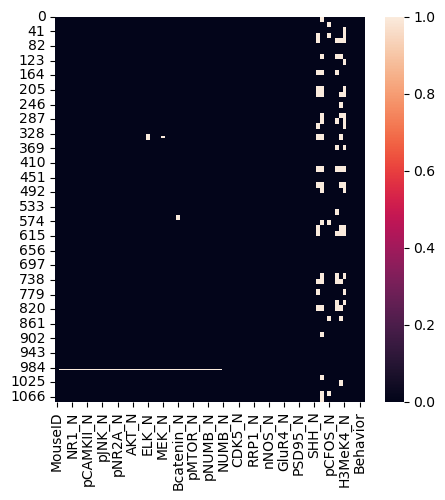

In [12]:
plt.figure(figsize=(5, 5))
sns.heatmap(df.isna(), cbar=True)
plt.show()

In [13]:
## Filling the missing values
non_numeric_cols = df.select_dtypes(exclude=['number']).columns

for col in df.columns:
    if col not in non_numeric_cols:
        df[col].fillna(df[col].mean(), inplace=True)

for col in non_numeric_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

In [14]:
for i in range(len(df.columns)):
    if df.iloc[:,i].isna().sum()!=0:
        print(i)
    else:
        print('None')

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


# Check  Duplicates

In [15]:
duplicates = df[df.duplicated()]
if duplicates.empty:
    print("No duplicates found.")
else:
    print("Duplicates found:")
    print(duplicates)

No duplicates found.


# Encoding

In [16]:
label_encoder = LabelEncoder()

In [17]:
### Encoding Categorical Variables"

label_encoder = LabelEncoder()
df['Genotype'] = label_encoder.fit_transform(df['Genotype'])
df['Treatment'] = label_encoder.fit_transform(df['Treatment'])
df['Behavior'] = label_encoder.fit_transform(df['Behavior'])
df['class'] = label_encoder.fit_transform(df['class'])


In [18]:
df

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,0,0,0,0
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,0,0,0,0
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,0,0,0,0
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,0,0,0,0
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,J3295_11,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,...,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,1,1,1,7
1076,J3295_12,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,...,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,1,1,1,7
1077,J3295_13,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,...,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,1,1,1,7
1078,J3295_14,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,...,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,1,1,1,7


In [19]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df.select_dtypes(include=['object']).columns

In [20]:
numerical_cols = numerical_cols.drop('class', errors='ignore')
categorical_cols = categorical_cols.drop(['MouseID', 'class'], errors='ignore')

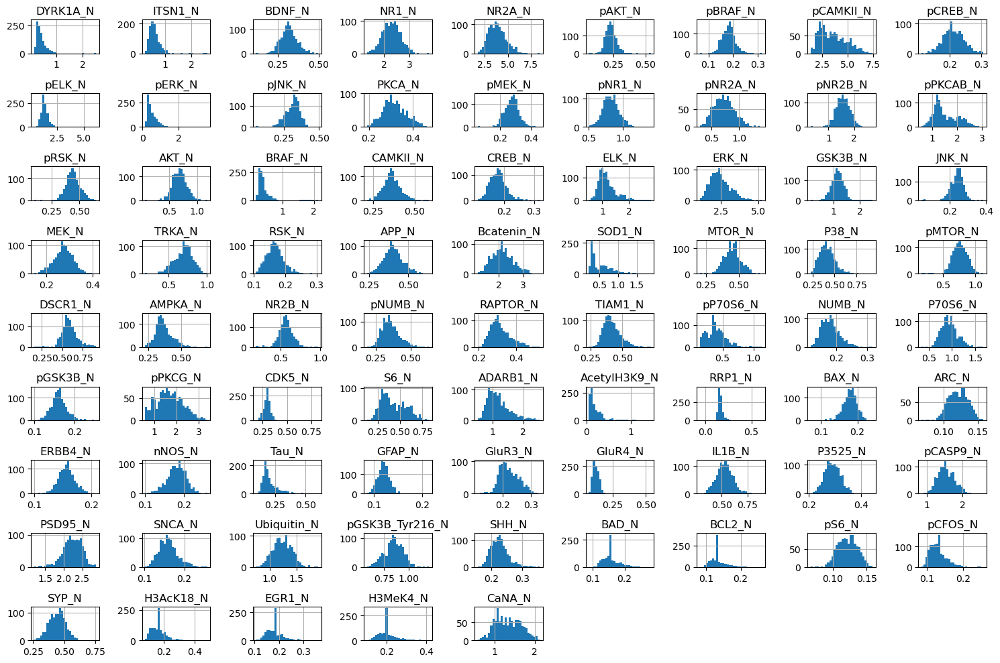

In [21]:
df[numerical_cols].hist(figsize=(15, 10), bins=30)
plt.tight_layout()
plt.show()

In [22]:
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first')

In [23]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Outlier Analysis

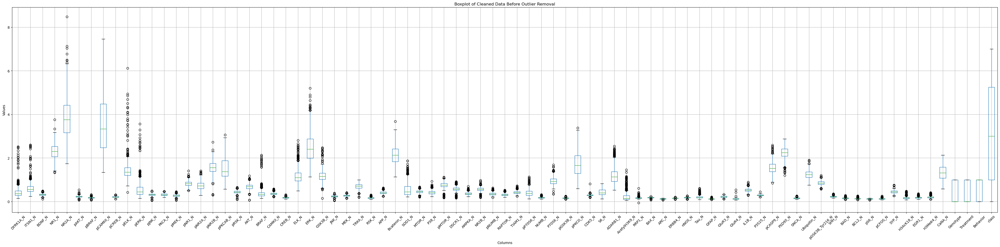

In [24]:
def boxplot_before(df):
    df.boxplot(figsize=(40, 10))
    plt.title('Boxplot of Cleaned Data Before Outlier Removal')
    plt.xticks(rotation=45)
    plt.xlabel('Columns')
    plt.ylabel('Values')
    plt.tight_layout()
    plt.show()


boxplot_before(df)

In [25]:
def count_outliers_iqr(df):
    numeric_df = df.select_dtypes(include=[np.number])
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = ((df < lower_bound) | (df > upper_bound)).sum()
    total_outliers = outliers.sum()
    return outliers, total_outliers

In [26]:
###Ensure numeric conversion if necessary
for column in df.columns:
    df[column] = pd.to_numeric(df[column], errors='coerce')

###Count and visualize outliers
initial_outliers, total_initial_outliers = count_outliers_iqr(df)
print("Number of outliers per column before removal:\n", initial_outliers)
print("Total number of outliers before removal:", total_initial_outliers)

Number of outliers per column before removal:
 MouseID       0
DYRK1A_N     48
ITSN1_N      45
BDNF_N       22
NR1_N         4
             ..
CaNA_N        0
Genotype      0
Treatment     0
Behavior      0
class         0
Length: 82, dtype: int64
Total number of outliers before removal: 1785


In [27]:
def remove_outliers_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_no_outliers = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]
    return df_no_outliers
    
cleaned_data = remove_outliers_iqr(df)    

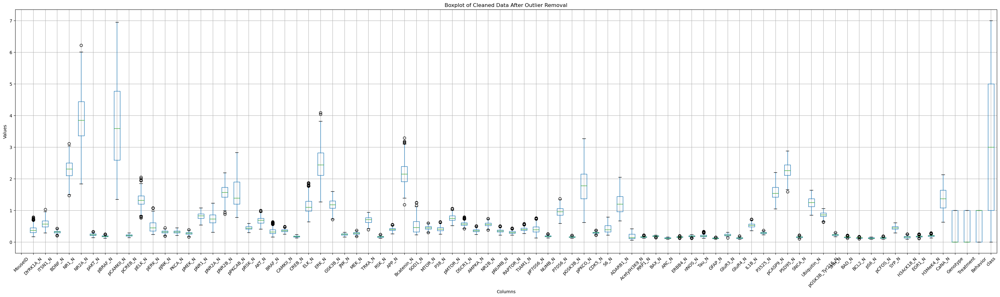

In [28]:
def boxplot_vis(df):
    
    df.boxplot(figsize=(40, 10))
    plt.title('Boxplot of Cleaned Data After Outlier Removal')
    plt.xticks(rotation=45)
    plt.xlabel('Columns')
    plt.ylabel('Values')
    plt.show()


boxplot_vis(cleaned_data)

# Highly Correlated Variables

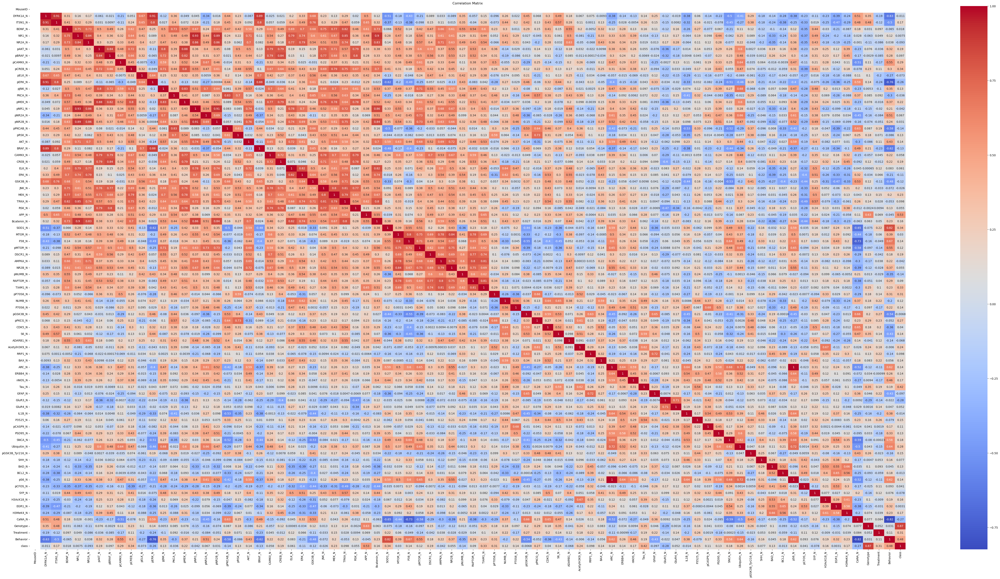

Highly correlated pairs:
DYRK1A_N -- ITSN1_N
DYRK1A_N -- pERK_N
DYRK1A_N -- BRAF_N
NR1_N -- pNR1_N
NR1_N -- pNR2B_N
NR1_N -- Bcatenin_N
NR2A_N -- pNR1_N
NR2A_N -- pNR2B_N
pAKT_N -- pMEK_N
pERK_N -- BRAF_N
pNR1_N -- pNR2B_N
pNR1_N -- Bcatenin_N
ARC_N -- pS6_N
Genotype -- class


In [29]:
correlation_matrix = cleaned_data.corr()

# Visualize the correlation matrix
plt.figure(figsize=(70, 35))
sns.heatmap(correlation_matrix, annot=True,cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Set a threshold for high correlation
threshold = 0.85

# Find pairs of highly correlated features
high_corr = np.where(correlation_matrix > threshold)

# Filter out the pairs where the correlation is 1 (self-correlation)
high_corr_pairs = [(correlation_matrix.index[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr) if x != y and x < y]

# Display the highly correlated pairs
print("Highly correlated pairs:")
for pair in high_corr_pairs:
    print(pair[0], "--", pair[1])

In [30]:
# Identify the target variable
target_variable = 'class'

# Assuming high_corr_pairs is a list of tuples with pairs of highly correlated features
features_to_remove = set()

for pair in high_corr_pairs:
    feature1, feature2 = pair
    if feature2 != target_variable:
        features_to_remove.add(feature2)

# Remove the redundant features
df_red = df.drop(columns=features_to_remove)

print("Features to remove:", features_to_remove)
print("Remaining features:", df_red.columns)


Features to remove: {'pNR1_N', 'pERK_N', 'ITSN1_N', 'pNR2B_N', 'pS6_N', 'Bcatenin_N', 'pMEK_N', 'BRAF_N'}
Remaining features: Index(['MouseID', 'DYRK1A_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N',
       'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pJNK_N', 'PKCA_N', 'pNR2A_N',
       'pPKCAB_N', 'pRSK_N', 'AKT_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N',
       'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'SOD1_N',
       'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N',
       'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N',
       'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'RRP1_N',
       'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N', 'GluR3_N',
       'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N',
       'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pCFOS_N',
       'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N', 'Genotype',
       'Treatment', 'Behavior', 'class']

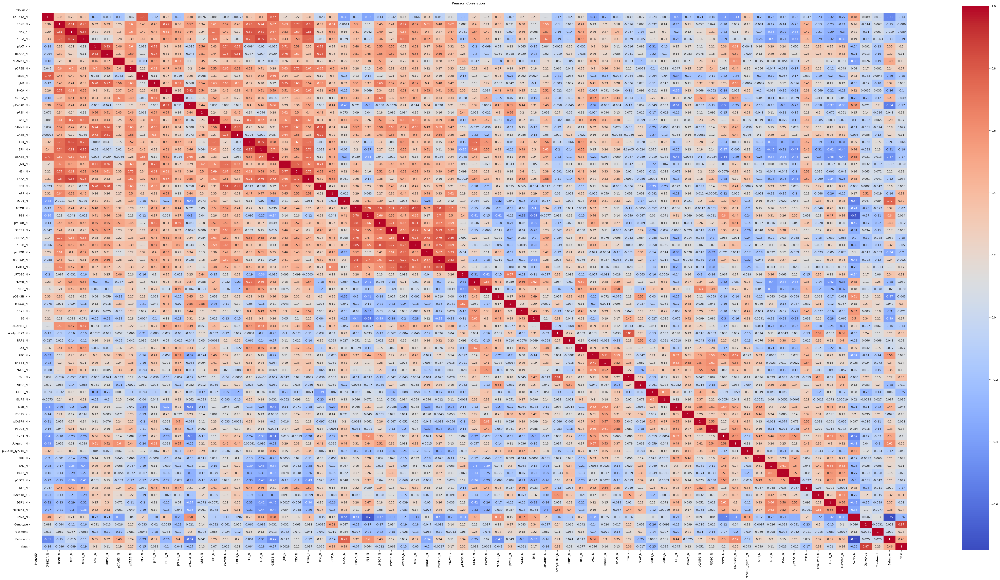

In [31]:
corr_mat = df_red.corr()
fig = plt.figure(figsize=(70,35))
sns.heatmap(corr_mat, annot=True, cmap='coolwarm')
plt.title('Pearson Correlation')
plt.show()

In [32]:
data = df_red

In [33]:
X = df.drop(columns=['MouseID', 'class'])  # Features
y = df['class']

# Scaling

In [34]:
# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


Feature Importances from Random Forest:
Treatment     0.115757
Genotype      0.102092
SOD1_N        0.047942
Behavior      0.045442
pPKCG_N       0.039940
                ...   
MEK_N         0.003013
Bcatenin_N    0.002681
GluR4_N       0.002497
EGR1_N        0.002406
pCFOS_N       0.002342
Length: 80, dtype: float64


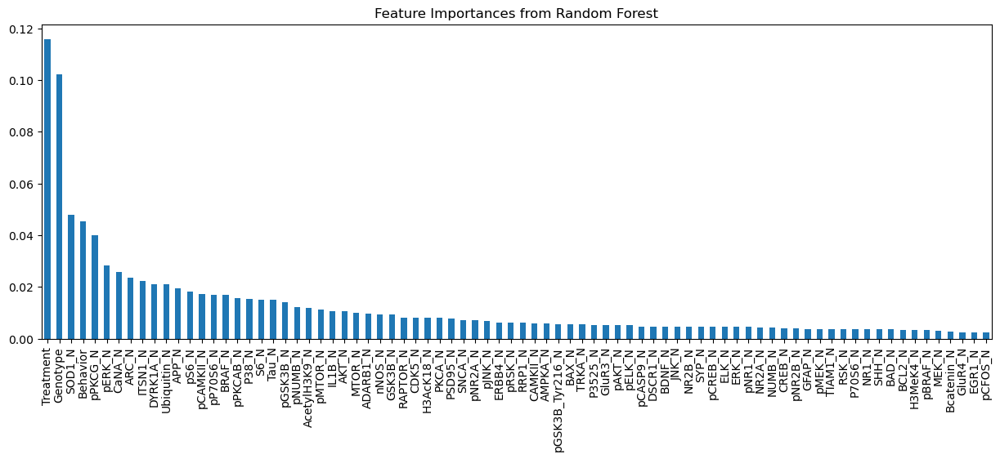

In [35]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_scaled, y)
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nFeature Importances from Random Forest:")
print(feature_importances)

# Plot feature importances
plt.figure(figsize=(15, 5))
feature_importances.plot(kind='bar')
plt.title('Feature Importances from Random Forest')
plt.show()


In [36]:
# Select top features (top 20 features)
top_features = feature_importances.head(20).index.tolist()
print("\nTop 20 features selected:")
print(top_features)


Top 20 features selected:
['Treatment', 'Genotype', 'SOD1_N', 'Behavior', 'pPKCG_N', 'pERK_N', 'CaNA_N', 'ARC_N', 'ITSN1_N', 'DYRK1A_N', 'Ubiquitin_N', 'APP_N', 'pS6_N', 'pCAMKII_N', 'pP70S6_N', 'BRAF_N', 'pPKCAB_N', 'P38_N', 'S6_N', 'Tau_N']


# Split the dataset

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=0)

In [38]:
X_train

array([[-0.4403136 , -0.48676168, -0.33740814, ..., -0.9459053 ,
         1.05718828,  0.97259753],
       [ 1.15696791,  1.55510244, -0.66927932, ...,  1.05718828,
        -0.9459053 , -1.02817453],
       [-0.86873354, -0.78102601, -1.23166982, ..., -0.9459053 ,
        -0.9459053 ,  0.97259753],
       ...,
       [-0.14215974, -0.13106009, -0.69336041, ...,  1.05718828,
        -0.9459053 ,  0.97259753],
       [-0.7367048 , -0.94906471,  0.61931201, ..., -0.9459053 ,
         1.05718828,  0.97259753],
       [-0.05459709, -0.16570043,  0.34272491, ...,  1.05718828,
        -0.9459053 , -1.02817453]])

In [39]:
X_test

array([[ 0.62444102,  0.74954992, -0.48256453, ...,  1.05718828,
         1.05718828, -1.02817453],
       [ 0.81086543,  0.65161583,  0.25610455, ...,  1.05718828,
         1.05718828, -1.02817453],
       [ 1.40045711,  1.71077466,  0.70214957, ...,  1.05718828,
        -0.9459053 , -1.02817453],
       ...,
       [ 0.63524583,  1.37612285,  2.50037775, ...,  1.05718828,
         1.05718828, -1.02817453],
       [-0.38116474, -0.22107037,  1.02170072, ..., -0.9459053 ,
         1.05718828,  0.97259753],
       [-0.60638706, -0.37667152, -0.52939569, ...,  1.05718828,
        -0.9459053 ,  0.97259753]])

In [40]:
y_train

474     3
634     4
283     2
395     1
492     3
       ..
1033    7
763     6
835     6
559     3
684     4
Name: class, Length: 864, dtype: int32

In [41]:
y_test

904    5
934    5
692    4
535    3
678    4
      ..
913    5
101    0
915    5
453    3
787    6
Name: class, Length: 216, dtype: int32

# Model Training and Evaluate

Training Random Forest...
Random Forest - Training Accuracy: 1.0000
Random Forest - Testing Accuracy: 1.0000
Random Forest - Accuracy: 100.00%

Random Forest - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



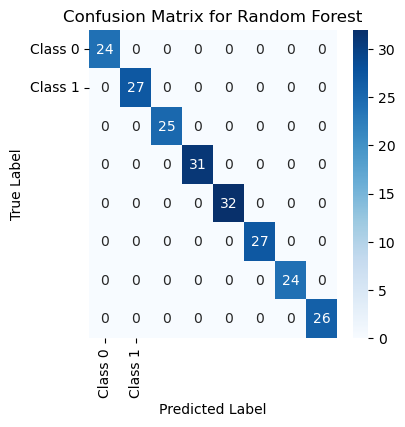

Random Forest - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training Logistic Regression...
Logistic Regression - Training Accuracy: 1.0000
Logistic Regression - Testing Accuracy: 1.0000
Logistic Regression - Accuracy: 100.00%

Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                           1.00    

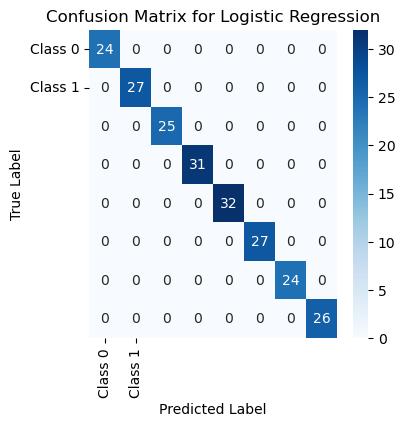

Logistic Regression - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training Decision Tree...
Decision Tree - Training Accuracy: 1.0000
Decision Tree - Testing Accuracy: 1.0000
Decision Tree - Accuracy: 100.00%

Decision Tree - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                           1.00       216
   macro avg     

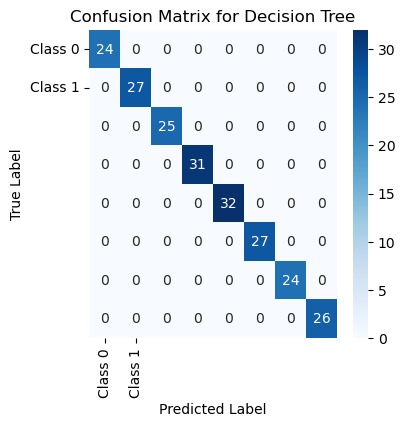

Decision Tree - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training SVM...
SVM - Training Accuracy: 1.0000
SVM - Testing Accuracy: 1.0000
SVM - Accuracy: 100.00%

SVM - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       

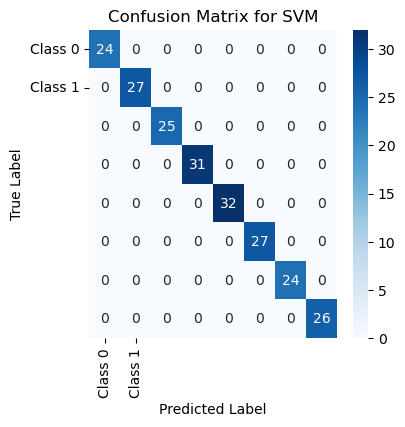

SVM - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training KNN...
KNN - Training Accuracy: 0.9942
KNN - Testing Accuracy: 0.9815
KNN - Accuracy: 98.15%

KNN - Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        24
           1       1.00      0.96      0.98        27
           2       1.00      1.00      1.00        25
           3       0.97      1.00      0.98        31
           4       1.00      1.00      1.00        32
           5       1.00      0.93      0.96        27
           6       1.00      0.96      0.98        24
           7       0.96      1.00      0.98        26

    accuracy                           0.98       216
   macro avg       0.98      0.98      0.98       216
weighted avg       0.98      0

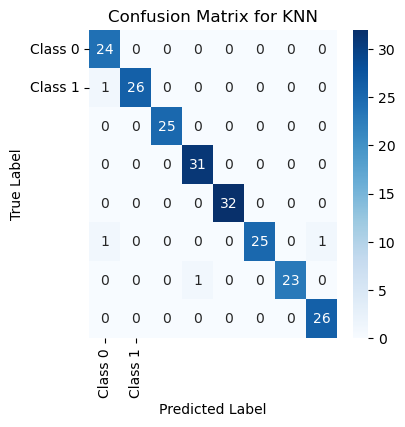

KNN - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 1 26  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 1  0  0  0  0 25  0  1]
 [ 0  0  0  1  0  0 23  0]
 [ 0  0  0  0  0  0  0 26]]



In [52]:
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=100, random_state=42),
    "Decision Tree": DecisionTreeClassifier(max_depth=5, random_state=42),
    "SVM": SVC(kernel='linear', random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=5)
}

# Train, predict, and evaluate each model
for model_name, model in models.items():
    print(f"Training {model_name}...")
    model.fit(X_train, y_train)
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    
    print(f"{model_name} - Training Accuracy: {train_acc:.4f}")
    print(f"{model_name} - Testing Accuracy: {test_acc:.4f}")
    print(f"{model_name} - Accuracy: {test_acc * 100:.2f}%\n")
    
    print(f"{model_name} - Classification Report:\n{classification_report(y_test, y_test_pred)}")
    
    cm = confusion_matrix(y_test, y_test_pred)
    
   
    plt.figure(figsize=(4,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()
    print(f"{model_name} - Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n")
    print("="*60)

# Hyparameter using RandomizedSearchCV

Training Random Forest with RandomizedSearchCV...
Random Forest - Best Parameters: {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 142}
Random Forest - Training Accuracy: 1.0000
Random Forest - Testing Accuracy: 1.0000
Random Forest - Accuracy: 100.00%

Random Forest - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



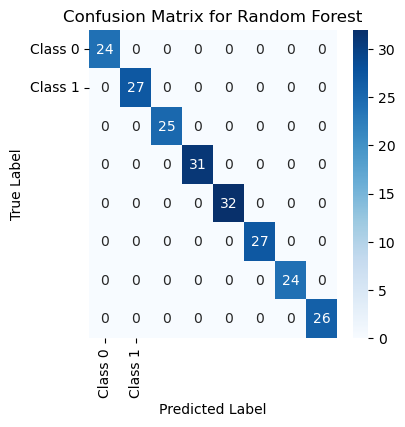

Random Forest - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training Logistic Regression with RandomizedSearchCV...
Logistic Regression - Best Parameters: {'C': 3.845401188473625, 'solver': 'lbfgs'}
Logistic Regression - Training Accuracy: 1.0000
Logistic Regression - Testing Accuracy: 1.0000
Logistic Regression - Accuracy: 100.00%

Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00      

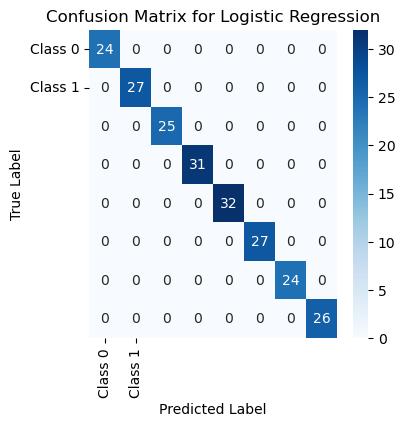

Logistic Regression - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training Decision Tree with RandomizedSearchCV...
Decision Tree - Best Parameters: {'max_depth': 10, 'min_samples_split': 5}
Decision Tree - Training Accuracy: 1.0000
Decision Tree - Testing Accuracy: 1.0000
Decision Tree - Accuracy: 100.00%

Decision Tree - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00    

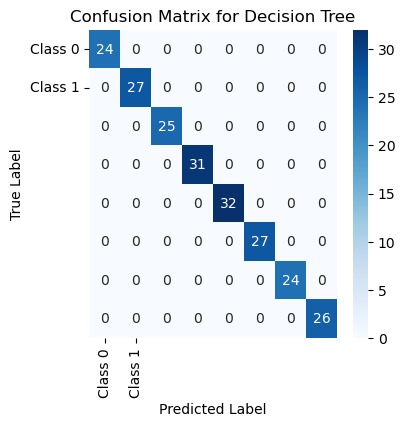

Decision Tree - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training SVM with RandomizedSearchCV...
SVM - Best Parameters: {'C': 3.845401188473625, 'kernel': 'linear'}
SVM - Training Accuracy: 1.0000
SVM - Testing Accuracy: 1.0000
SVM - Accuracy: 100.00%

SVM - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                       

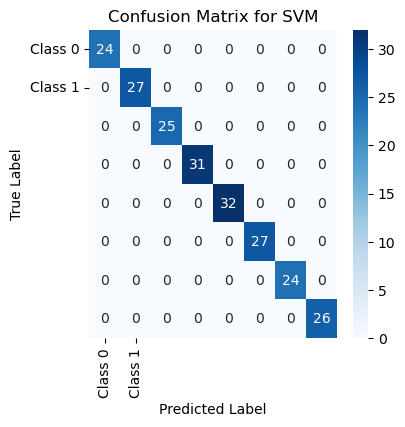

SVM - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]

Training KNN with RandomizedSearchCV...
KNN - Best Parameters: {'n_neighbors': 2, 'weights': 'distance'}
KNN - Training Accuracy: 1.0000
KNN - Testing Accuracy: 1.0000
KNN - Accuracy: 100.00%

KNN - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        24
           1       1.00      1.00      1.00        27
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        32
           5       1.00      1.00      1.00        27
           6       1.00      1.00      1.00        24
           7       1.00      1.00      1.00        26

    accuracy                           1.00     

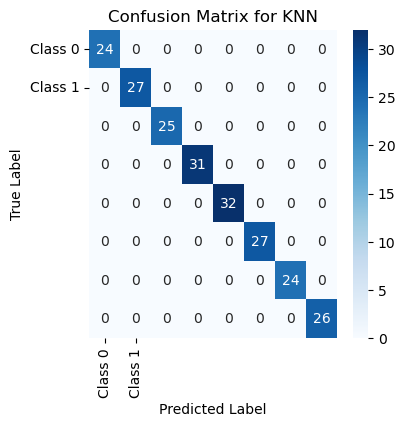

KNN - Confusion Matrix:
[[24  0  0  0  0  0  0  0]
 [ 0 27  0  0  0  0  0  0]
 [ 0  0 25  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 32  0  0  0]
 [ 0  0  0  0  0 27  0  0]
 [ 0  0  0  0  0  0 24  0]
 [ 0  0  0  0  0  0  0 26]]



In [53]:
param_distributions = {
    "Random Forest": {
        'n_estimators': randint(50, 200),
        'max_depth': [None, 10, 20],
        'min_samples_split': randint(2, 11)
    },
    "Logistic Regression": {
        'C': uniform(0.1, 10.0),
        'solver': ['lbfgs', 'liblinear']
    },
    "Decision Tree": {
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': randint(2, 11)
    },
    "SVM": {
        'C': uniform(0.1, 10.0),
        'kernel': ['linear', 'rbf']
    },
    "KNN": {
        'n_neighbors': randint(1, 30),
        'weights': ['uniform', 'distance']
    }
}

# Initialize models
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=100, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "SVM": SVC(random_state=42),
    "KNN": KNeighborsClassifier()
}

# Perform RandomizedSearchCV for hyperparameter tuning, training, and evaluating each model
for model_name, model in models.items():
    print(f"Training {model_name} with RandomizedSearchCV...")
    
    random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions[model_name], 
                                       n_iter=50, cv=5, scoring='accuracy', n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)
    
    best_model = random_search.best_estimator_
    
    y_train_pred = best_model.predict(X_train)
    y_test_pred = best_model.predict(X_test)
    
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    
    print(f"{model_name} - Best Parameters: {random_search.best_params_}")
    print(f"{model_name} - Training Accuracy: {train_acc:.4f}")
    print(f"{model_name} - Testing Accuracy: {test_acc:.4f}")
    print(f"{model_name} - Accuracy: {test_acc * 100:.2f}%\n")
    
    print(f"{model_name} - Classification Report:\n{classification_report(y_test, y_test_pred)}")
    
    cm = confusion_matrix(y_test, y_test_pred)
    
  
    plt.figure(figsize=(4,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()
    print(f"{model_name} - Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n")
    print("="*60)

# Interpretation Result

In [44]:
key_proteins = feature_importances.head(20).index.tolist()
print("\nKey proteins identified for classification:")
print(key_proteins)


Key proteins identified for classification:
['Treatment', 'Genotype', 'SOD1_N', 'Behavior', 'pPKCG_N', 'pERK_N', 'CaNA_N', 'ARC_N', 'ITSN1_N', 'DYRK1A_N', 'Ubiquitin_N', 'APP_N', 'pS6_N', 'pCAMKII_N', 'pP70S6_N', 'BRAF_N', 'pPKCAB_N', 'P38_N', 'S6_N', 'Tau_N']


In [45]:
print(type(best_model))


<class 'sklearn.neighbors._classification.KNeighborsClassifier'>


# Random Forest for Feature Importance

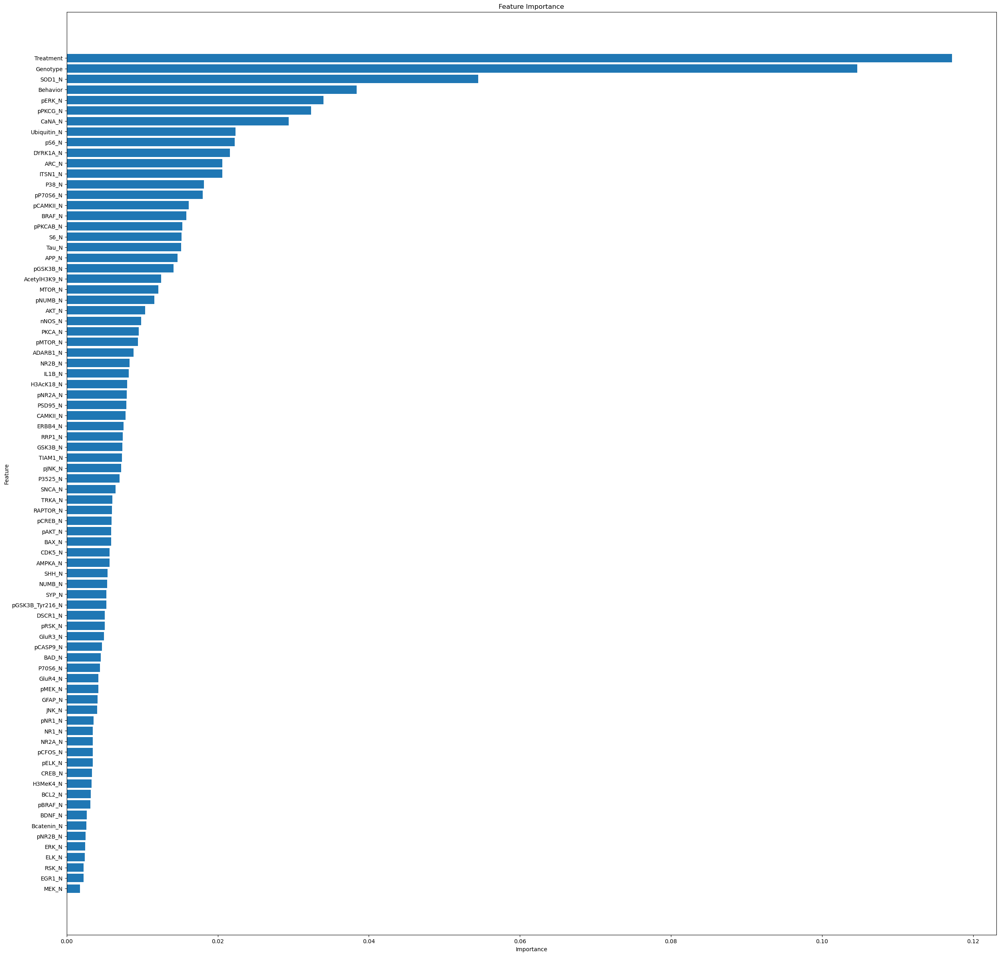

        Feature  Importance
78    Treatment    0.117221
77     Genotype    0.104648
32       SOD1_N    0.054491
79     Behavior    0.038413
10       pERK_N    0.033972
46      pPKCG_N    0.032358
76       CaNA_N    0.029408
65  Ubiquitin_N    0.022347
70        pS6_N    0.022240
0      DYRK1A_N    0.021597


In [46]:
from sklearn.ensemble import RandomForestClassifier

# Assuming X_train and y_train are defined and preprocessed

# Train a Random Forest to get feature importances
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

feature_importance = rf_model.feature_importances_


if feature_importance is not None:
    feature_names = X.columns
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(30, 30))
    plt.barh(importance_df['Feature'], importance_df['Importance'])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importance')
    plt.gca().invert_yaxis()
    plt.show()

    print(importance_df.head(10))  # Top 10 important features
else:
    print("Feature importance is not available for the chosen model.")


# Linear SVM for Feature Importance

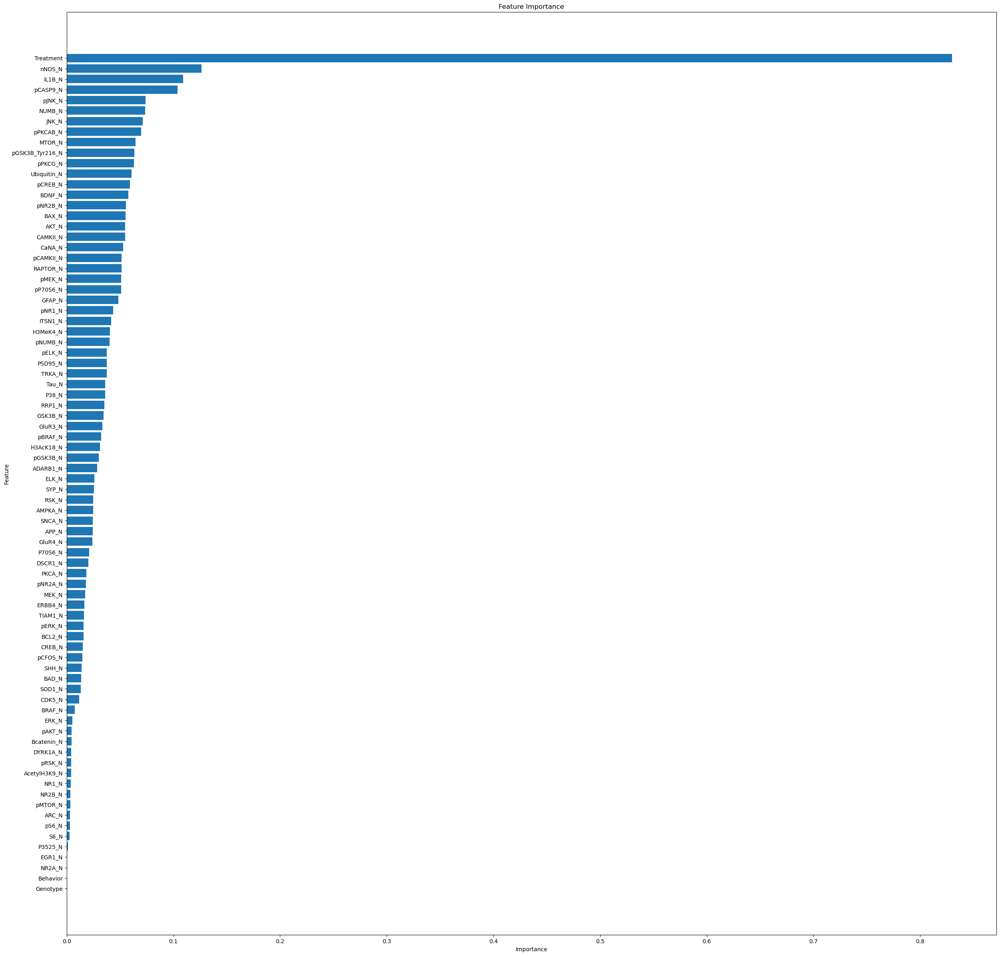

            Feature  Importance
78        Treatment    0.829972
55           nNOS_N    0.126465
60           IL1B_N    0.109118
62         pCASP9_N    0.103877
11           pJNK_N    0.074012
43           NUMB_N    0.073690
26            JNK_N    0.071474
17         pPKCAB_N    0.069624
33           MTOR_N    0.064567
66  pGSK3B_Tyr216_N    0.063288


In [47]:
from sklearn.svm import SVC

# Assuming X_train and y_train are defined and preprocessed

# Train a Linear SVM to get feature importances (coefficients)
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

feature_importance = np.abs(svm_model.coef_[0])


if feature_importance is not None:
    feature_names = X.columns
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(30,30))
    plt.barh(importance_df['Feature'], importance_df['Importance'])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importance')
    plt.gca().invert_yaxis()
    plt.show()

    print(importance_df.head(10))  # Top 10 important features
else:
    print("Feature importance is not available for the chosen model.")
